<a href="https://colab.research.google.com/github/dilrubashowkat/MLearn/blob/master/Women_ecommerce_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import files
files.upload()

Saving womens-ecommerce-clothing-reviews.zip to womens-ecommerce-clothing-reviews.zip


{'womens-ecommerce-clothing-reviews.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00k\x9fCL\xb7\x9c\x96j\x82\x9d,\x00xr\x81\x00&\x00\x00\x00Womens Clothing E-Commerce Reviews.csv\x94\xbd\xdb\x92\xe3\xd8\x91-\xf8\x9ef\xfa\x07\x045\xa6\x88<\x86@\x06\xc9\xb8J\x0fe%\xe9\xa8\xbbzZj\x99\xaa\xa6\xdbz\xcc\xe6\x01$\xc1 *H\x80\x02\xc0\x88d=\xcc\xcf\xcco\xcc\xd3\xcc\x8f\x8d\xaf\xe5\xee{o0.Y#\xeb\x962\x93$.{\xfb\xf6\xcb\xf2\xe5\xee\xf9\x9f\xb6\xed\xb0\xa9\x9b\xc7\xec\x87?\xe7\xdf?V\xf9O\xf5\xb0\xad\xf2\x7fT\xcfu\xf5\x92\xfdT}\x1d\xf2\x7f\x94\x83|.\xff\xb4lw\xbb\xaaYU\xab\xec\x87\xbf\xfd9\xff{\xdb\xd7C\xfd\\e\x7f\xa9\xaa\xd5\xa2\\>e\x7fj\x0f\xcd\x90\xff\xb9~\xae\xfb\xbam\xb2\xbf\x95\xbb*\xffs\xb5/\xbbA~6\xe8\xdf\xff\xb4-\xfb\x9e\x7f\xfct\x95\xdf\xdd\xde\xe5\xf3y\x9e\x7f\xbf\xe8\xdb\xeda\xa8\xb6\xc7\xec\xa5\x95\x1bt\xeb\xc36\xbb\xcc\xfaz\xfbt\xcc\xcaf\x95\xf5\xd5W\xfd\x83<\xc2\xba\xed\x86r!\xcfx\x9dO\xf3\xab\xfc\x87\xa6\x1ev\xe5P\xf5\xf2\xa7\xa1\xc6\x9f\xc2\x1f\xfaO\xd3|zu\x7f\x95\xcf\xaf\xf3|\xf2\xef\xad

In [6]:
!unzip womens-ecommerce-clothing-reviews.zip

Archive:  womens-ecommerce-clothing-reviews.zip
  inflating: Womens Clothing E-Commerce Reviews.csv  


In [0]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
!kaggle datasets list

In [0]:
!kaggle competitions download -c jigsaw-toxic-comment-classification-challenge

In [0]:
!kaggle --version

In [7]:
ls

 kaggle.json   'Womens Clothing E-Commerce Reviews.csv'
 sample_data/   womens-ecommerce-clothing-reviews.zip


In [0]:
# Importing modules
import math
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import os, random, cv2
#from matplotlib import style
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
!pip install -U scikit-learn


#matplotlib inline
# Let's check the labels


In [12]:
df= pd.read_csv("Womens Clothing E-Commerce Reviews.csv")
df.describe()

,Unnamed: 0,Clothing ID,Age,Rating,Recommended IND,Positive Feedback Count
count,23486.000000,23486.000000,23486.000000,23486.000000,23486.000000,23486.000000
mean,11742.500000,918.118709,43.198544,4.196032,0.822362,2.535936
std,6779.968547,203.298980,12.279544,1.110031,0.382216,5.702202
min,0.000000,0.000000,18.000000,1.000000,0.000000,0.000000
25%,5871.250000,861.000000,34.000000,4.000000,1.000000,0.000000
50%,11742.500000,936.000000,41.000000,5.000000,1.000000,1.000000
75%,17613.750000,1078.000000,52.000000,5.000000,1.000000,3.000000
max,23485.000000,1205.000000,99.000000,5.000000,1.000000,122.000000


In [13]:
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [14]:
#https://stackoverflow.com/questions/51070985/find-out-the-percentage-of-missing-values-in-each-column-in-the-given-dataset
df.isna().sum()*100/df.shape[0]


Unnamed: 0                  0.000000
Clothing ID                 0.000000
Age                         0.000000
Title                      16.222430
Review Text                 3.597888
Rating                      0.000000
Recommended IND             0.000000
Positive Feedback Count     0.000000
Division Name               0.059610
Department Name             0.059610
Class Name                  0.059610
dtype: float64

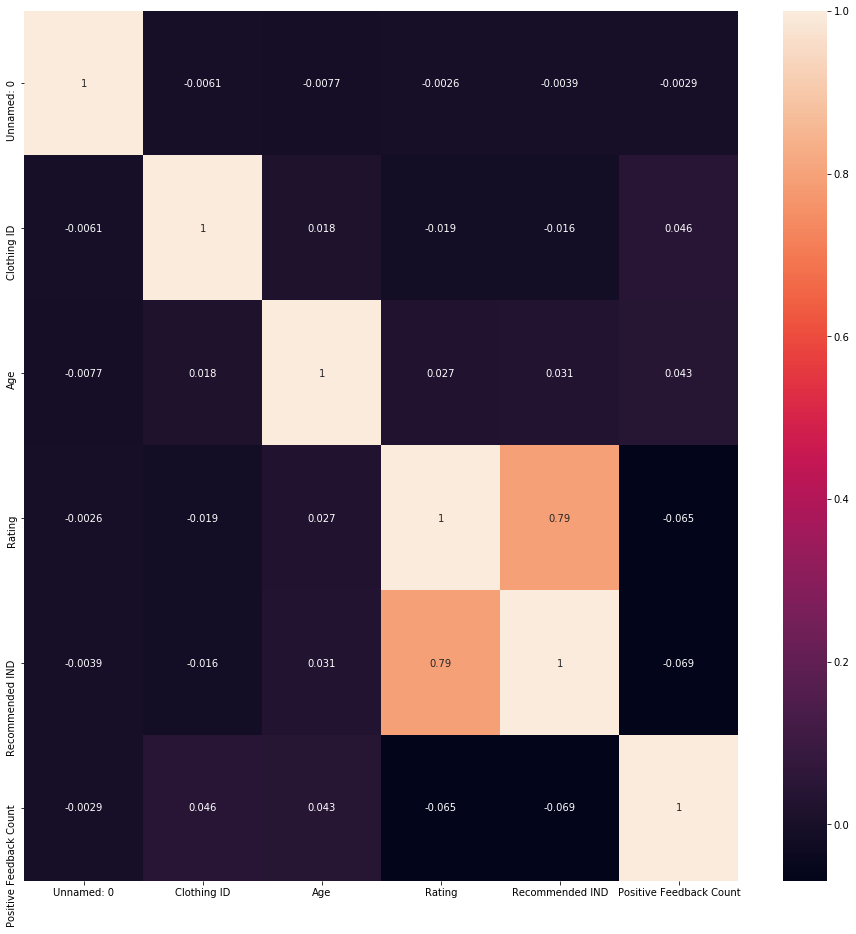

In [15]:
corr = df.corr()
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(corr, annot=True,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)



